In [4]:
import pandas as pd

import folium

df = pd.read_csv('K:/COMMUNITY ENGAGEMENT/Neighborhood Resources/Energy_Environment/Keep Charlotte Beautiful/AmeriCorps/FOR JONATHAN (and future AmeriCorps member)/Litter Study/Study Maps and Exports/Maps/locationcsv.csv')


m = folium.Map(location=[35.2271, -80.8431], zoom_start=12)


for index, row in df.iterrows():
    folium.Marker(
        location=[row['Lat'], row['Long']],
        popup=row['Litter'],  
    ).add_to(m)

# Display the map
m


In [5]:
!pip install folium

In [6]:


# Create a base map centered around Charlotte, NC
m = folium.Map(location=[35.2271, -80.8431], zoom_start=12)

# Define a function to return a color based on the litter amount
def get_color(Litter):
    if Litter < 30:
        return 'blue'
    elif 10 <= Litter < 50:
        return 'orange'
    else:
        return 'red'

# Add CircleMarkers to the map based on litter levels
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=5,  
        color=get_color(row['Litter']),  # Color based on litter level
        fill=True,
        fill_opacity=0.7,
        popup=f"Location: {row['Litter']}"
    ).add_to(m)

# Display the map
m


In [7]:
# Create a legend using HTML
legend_html = """
     <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 150px; height: 90px; 
                 border:2px solid grey; z-index:9999; font-size:14px;
                 background-color:white; padding: 10px;">
       <h4 style="text-align:center">Legend</h4>
       <p><i class="fa fa-circle" style="color:red"></i> Red Marker</p>
       <p><i class="fa fa-circle" style="color:blue"></i> Blue Marker</p>
     </div>
     """

# Add the legend to the map
m.get_root().html.add_child(folium.Element(legend_html))

In [8]:
# Create a base map centered around Charlotte, NC
m = folium.Map(location=[35.2271, -80.8431], zoom_start=12)

# Define a function to return a color based on the litter amount
def get_color(Litter):
    if Litter < 30:
        return 'blue'
    elif 10 <= Litter < 80:
        return 'orange'
    else:
        return 'red'

# Add CircleMarkers to the map based on litter levels
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=5,  
        color=get_color(row['Litter']),  # Color based on litter level
        fill=True,
        fill_opacity=0.7,
        popup=f"Litter Count: {row['Litter']}"
    ).add_to(m)
# Create a legend using HTML
legend_html = """
 <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 150px; height: 150px; 
                 border:2px solid grey; z-index:9999; font-size:10px;
                 background-color:white; padding: 10px;">
       <h4 style="text-align:center">Legend</h4>
       <p><i class="fa fa-circle" style="color:blue"></i> Less than 30 pieces of litter</p>
       <p><i class="fa fa-circle" style="color:orange"></i> Between 30 and 80 pieces of litter</p>
       <p><i class="fa fa-circle" style="color:red"></i> More than 80 pieces of litter</p>
     </div>
     """
m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m

In [9]:
!pip install geopandas

In [10]:
import geopandas as gpd

In [11]:
shapefile_path = 'C:/Users/17858c/Downloads/Council_Districts/Council_Districts.shp'
gdf = gpd.read_file(shapefile_path)

In [12]:
folium.GeoJson(gdf).add_to(m)

In [13]:
m

In [14]:
print(gdf)

   OBJECTID District       DistrictRe                         RepEmail  \
0         1        7        Ed Driggs                  ed@eddriggs.com   
1         2        3    Tiawana Brown    Tiawana.Brown@charlottenc.gov   
2         3        6    Tariq Bokhari    Tariq.Bokhari@charlottenc.gov   
3         4        2   Malcolm Graham   Malcolm.Graham@charlottenc.gov   
4         5        4    Renee Johnson    Renee.Johnson@charlottenc.gov   
5         6        1   Dante Anderson   Dante.Anderson@charlottenc.gov   
6         7        5  Marjorie Molina  Marjorie.Molina@charlottenc.gov   

     SHAPESTAre     SHAPESTLen  \
0  1.149506e+09  233200.146172   
1  1.899851e+09  469709.257046   
2  1.063571e+09  190104.878894   
3  1.365822e+09  491036.301704   
4  1.218127e+09  457075.873373   
5  9.324958e+08  217875.707131   
6  1.114363e+09  317100.167259   

                                            geometry  
0  POLYGON ((1473930.125 507326.563, 1474075 5071...  
1  MULTIPOLYGON (((14072

In [15]:
import random

In [16]:
gdf.explore
m

In [17]:
!pip install folium matplotlib mapclassify


In [18]:
import matplotlib
import mapclassify

In [19]:
import folium
import geopandas as gpd
import random  # Import the random module


shapefile_path = 'C:/Users/17858c/Downloads/Council_Districts/Council_Districts.shp'
gdf = gpd.read_file(shapefile_path)

# Initialize a Folium map
m2 = folium.Map(location=[35.2271, -80.8431], zoom_start=11)  # Charlotte's lat/lon

# Create a color map (a dictionary mapping each district to a color)
district_colors = {}
for idx, district in enumerate(gdf['District'].unique()):  
    # Assign a random color to each district
    district_colors['District'] = "#%06x" % random.randint(0, 0xFFFFFF)
    
# Define the style function to give each district a different color
def style_function(feature):
    district_name = feature['properties']['District']  
    return {
        'fillColor': district_colors[district],
        'color': 'black',
        'weight': 2,
        'dashArray': '5, 5',
        'fillOpacity': 0.6,
    }

# Add tooltips to display district names
tooltip = folium.GeoJsonTooltip(
    fields=['District'],  # Adjust based on your shapefile's field for district names
    aliases=['District: '],
    localize=True
)

# Add the GeoJSON layer to the map
geojson_layer = folium.GeoJson(
    gdf,
    style_function=style_function,
    tooltip=tooltip,
).add_to(m2)

# Save the map to an HTML file and display
m2


KeyError: '5'

In [ ]:
import folium
import geopandas as gpd
import random  # Import the random module


shapefile_path = 'C:/Users/17858c/Downloads/Council_Districts/Council_Districts.shp'
gdf = gpd.read_file(shapefile_path)

# Print the columns to check for the correct field name for the districts
print(gdf.columns)


district_column = 'District'  

# Create a color map (a dictionary mapping each district to a unique color)
district_colors = {}
for idx, district in enumerate(gdf[district_column].unique()):  # Using the correct column here
    # Assign a random color to each district
    district_colors[str(district)] = "#%06x" % random.randint(0, 0xFFFFFF)  # Convert district to string

# Define the style function to give each district a different color
def style_function(feature):
    district_name = str(feature['properties'][district_column])  # Convert to string in case it's a number
    return {
        'fillColor': district_colors[District],  # Now using the correct key
        'color': 'black',
        'weight': 2,
        'dashArray': '5, 5',
        'fillOpacity': 0.6,
    }

# Add tooltips to display district names
tooltip = folium.GeoJsonTooltip(
    fields=[district_column],  # Adjust based on your shapefile's field for district names
    aliases=['District: '],
    localize=True
)

# Add the GeoJSON layer to the map
geojson_layer = folium.GeoJson(
    gdf,
    style_function=style_function,
    tooltip=tooltip,
).add_to(m)

# Save the map to an HTML file and display

m


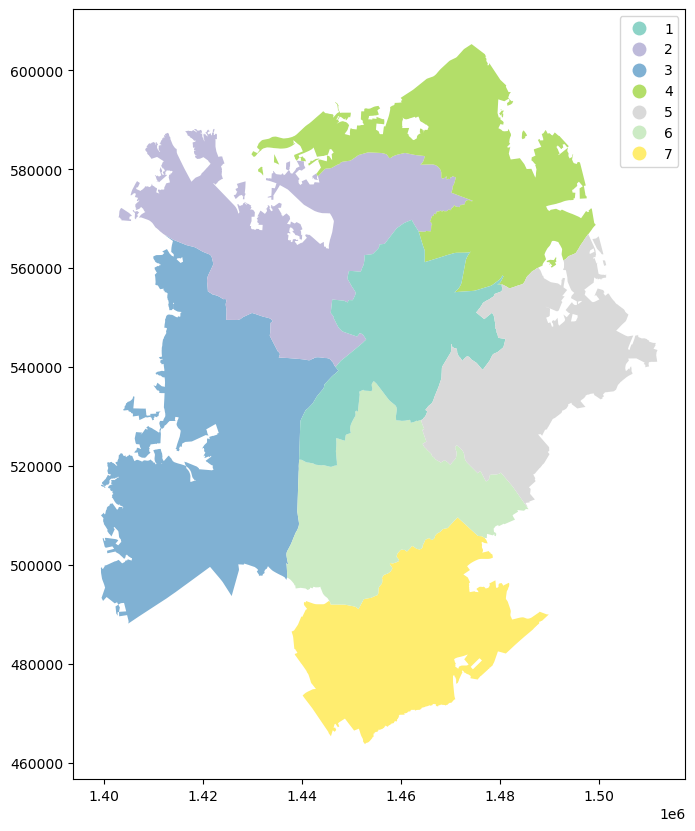

In [20]:
import geopandas as gpd
import matplotlib.pyplot as plt



# Plotting the GeoDataFrame
fig, ax = plt.subplots(figsize=(10, 10))

# Assign each district its own color using the 'column' parameter
gdf.plot(column='District', ax=ax, legend=True, cmap='Set3')

# Display the plot
gdf.explore()


In [ ]:
pip install branca

In [23]:
#import geopandas as gpd
#import folium
#import branca

# Get the center of your GeoDataFrame for initializing the map
#center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]

# Initialize the Folium map
#m3 = folium.Map(location=center, zoom_start=12)

# Create a colormap using branca
#colormap = branca.colormap.linear.Set3_08.scale(gdf['District'].min(), gdf['District'].max())

# Function to add each district with a different color
#folium.GeoJson(
   # gdf,
   # style_function=lambda feature: {
      #  'fillColor': colormap(feature['District']),
      #  'color': 'black',
      #  'weight': 1.5,
      #  'fillOpacity': 0.6
   # },
   # tooltip=folium.GeoJsonTooltip(fields=['District'])
#).add_to(m3)

# Display the map
#m3



In [24]:
gdf.columns

Index(['OBJECTID', 'District', 'DistrictRe', 'RepEmail', 'SHAPESTAre',
       'SHAPESTLen', 'geometry'],
      dtype='object')

In [ ]:
pip install pandas

In [25]:
import pandas as pd


<AxesSubplot: >

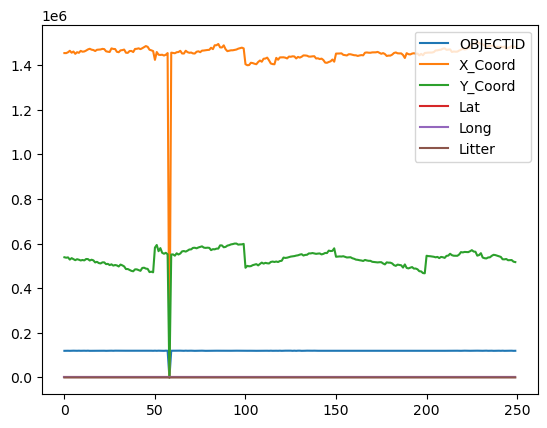

In [26]:
df.plot()

In [ ]:
pip install geopy

In [27]:
import pandas as pd
import folium



#  Initialize a map centered at the mean of all locations
center_lat = df['Lat'].mean()
center_lon = df['Long'].mean()

map_plot = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Add markers to the map for each address
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=row['Litter'] / 10,  # Scale the radius by litter amount
        popup=f"{row['Address']} - Litter: {row['Litter']}",
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(map_plot)



# To display the map in Jupyter directly
map_plot



In [28]:


# Convert the GeoDataFrame to GeoJSON format so folium can use it
geojson_data = gdf.to_crs(epsg=4326).to_json()  # Make sure the CRS is in WGS84 (EPSG:4326)

#  Initialize the map, centered at the mean latitude and longitude
center_lat = df['Lat'].mean()
center_lon = df['Long'].mean()
map_plot = folium.Map(location=[center_lat, center_lon], zoom_start=12)

#Add the shapefile as an overlay using GeoJSON
folium.GeoJson(
    geojson_data,
    name='Council Districts',
    style_function=lambda feature: {
        'fillColor': 'orange',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.2,
    }
).add_to(map_plot)
#Plot the points for each address
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=row['Litter'] / 10,  # Adjust the size based on the litter amount
        popup=f"{row['Address']} - Litter: {row['Litter']}",
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(map_plot)

#Add layer control to switch between council districts and markers
folium.LayerControl().add_to(map_plot)




map_plot


In [29]:
import matplotlib.colors as mcolors

In [36]:



unique_districts = gdf['District'].unique()
colors = list(mcolors.TABLEAU_COLORS.values())  # Get a predefined color palette
district_colors = {district: colors[i % len(colors)] for i, district in enumerate(unique_districts)}

# Step 5: Initialize the map, centered at the mean latitude and longitude
center_lat = df['Lat'].mean()
center_lon = df['Long'].mean()
map_plot = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Step 6: Add the shapefile with different colors for each district
def style_function(feature):
    district_id = feature['properties']['District']  
    return {
        'fillColor': district_colors[district_id],
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.4,
    }

folium.GeoJson(
    geojson_data,
    name='Council Districts',
    style_function=style_function
).add_to(map_plot)

# Step 7: Plot the points for each address
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=row['Litter'] / 10,  # Adjust the size based on the litter amount
        popup=f"{row['Address']} - Litter: {row['Litter']}",
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(map_plot)

# Step 8: Add layer control to switch between council districts and markers
folium.LayerControl().add_to(map_plot)

map_plot.save('litter_map2.html')
# To display the map directly in Jupyter Notebook:
map_plot


In [31]:
gdf.columns

Index(['OBJECTID', 'District', 'DistrictRe', 'RepEmail', 'SHAPESTAre',
       'SHAPESTLen', 'geometry'],
      dtype='object')

In [32]:

unique_districts = gdf['District'].unique()
colors = list(mcolors.TABLEAU_COLORS.values())  # Get a predefined color palette
district_colors = {district: colors[i % len(colors)] for i, district in enumerate(unique_districts)}

#Initialize the map, centered at the mean latitude and longitude
center_lat = df['Lat'].mean()
center_lon = df['Long'].mean()
map_plot = folium.Map(location=[center_lat, center_lon], zoom_start=12)

#Add the shapefile with different colors for each district
def style_function(feature):
    district_id = feature['properties']['District']  
    return {
        'fillColor': district_colors[district_id],
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.4,
    }

folium.GeoJson(
    geojson_data,
    name='Council Districts',
    style_function=style_function
).add_to(map_plot)

 #Plot the points for each address
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=3,
        popup=f"{row['Address']} - Litter: {row['Litter']}",
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(map_plot)


folium.LayerControl().add_to(map_plot)


map_plot

In [33]:
from matplotlib import cm


unique_districts = gdf['District'].unique()  
colors = list(mcolors.TABLEAU_COLORS.values())  # Predefined color palette
district_colors = {district: colors[i % len(colors)] for i, district in enumerate(unique_districts)}

# Step 5: Initialize the map
center_lat = df['Lat'].mean()
center_lon = df['Long'].mean()
map_plot = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Step 6: Add the shapefile with different colors for each district
def style_function(feature):
    district_id = feature['properties']['District']  # Use correct column name from shapefile
    return {
        'fillColor': district_colors[district_id],
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.4,
    }

folium.GeoJson(
    geojson_data,
    name='Council Districts',
    style_function=style_function
).add_to(map_plot)

def get_color_for_litter_amount(litter_amount):
    if litter_amount <= 30:
        return 'blue'  # Low range
    elif 11 <= litter_amount <= 80:
        return 'yellow'  # Medium range
    elif litter_amount > 80:
        return 'red'  # High range
    else:
        return 'gray'  # Fallback color for unexpected values

# Step 8: Plot the points for each address with color-coded litter amounts based on the defined ranges
for index, row in df.iterrows():
    litter_amount = row['Litter']
    
    # Get the color based on the litter amount using the custom function
    color = get_color_for_litter_amount(litter_amount)
    
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=5,  # Set a constant radius for all markers
        popup=f"{row['Address']} - Litter Amount: {row['Litter']}",
        color=color,  # Use the color based on the litter amount range
        fill=True,
        fill_color=color
    ).add_to(map_plot)
    
folium.LayerControl().add_to(map_plot)

legend_html = f"""
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 300px; height: auto; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white;
            padding: 10px;
            ">
    <h4 style="margin-top: 5px">Litter Amount & Council Districts</h4>
    <div style="display: flex; justify-content: space-between;">
        <div style="flex: 1; padding-right: 10px;">
            <b>Litter Amount</b><br>
            <i style="background:blue; width:20px; height:20px; display:inline-block;"></i> Low (<= 30)<br>
            <i style="background:yellow; width:20px; height:20px; display:inline-block;"></i> Medium (11 - 80)<br>
            <i style="background:red; width:20px; height:20px; display:inline-block;"></i> High (> 80)<br>
        </div>
        <div style="flex: 1;">
            <b>Council Districts</b><br>
            {''.join([f'<i style="background:{district_colors[district]}; width:20px; height:20px; display:inline-block;"></i> {district}<br>' for district in unique_districts])}
        </div>
    </div>
</div>
"""

# Add the legend to the map
map_plot.get_root().html.add_child(folium.Element(legend_html))

map_plot.save('litter_map_with_sorted_legend.html')
# To display in Jupyter:
map_plot


In [34]:
map_plot.save('litter_map_final.html')